# Modules

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import cv2
from PIL import Image
import matplotlib.pyplot as plt

import torchvision
import torchvision.transforms as transforms
import torchvision.models as models

import numpy as np
from collections import defaultdict
from tqdm import tqdm
import random
import time

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

Mount Google Drive

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
!rm -rf /usr/local/lib/python2.7
!rm -rf /swift

Preprocess the image

In [5]:
imsize = 512 if torch.cuda.is_available() else 128
cnn_normalization_mean = [0.485, 0.456, 0.406]
cnn_normalization_std = [0.229, 0.224, 0.225]
tensor_normalizer = transforms.Normalize(mean=cnn_normalization_mean, std=cnn_normalization_std)
epsilon = 1e-5

def image_loader(path):
    loader = transforms.Compose([
          transforms.Resize((imsize,imsize)), 
          transforms.CenterCrop(imsize), 
          transforms.ToTensor(), 
          tensor_normalizer, 
      ])
    image = Image.open(path)
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

unloader = transforms.ToPILImage()  # reconvert into PIL image
plt.ion()

def image_unloader(tensor):
    image = tensor.detach().cpu().numpy()
    image = image * np.array(cnn_normalization_std).reshape((1, 3, 1, 1)) + \
    np.array(cnn_normalization_mean).reshape((1, 3, 1, 1))
    return (image.transpose(0, 2, 3, 1) * 255.).clip(0, 255).astype(np.uint8)[0]

def imshow(tensor, title=None):
    image = image_unloader(tensor)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

def imsave(tensor, path, name):
    output_img = image_unloader(tensor)
    output_img.save(path+name,'JPEG')

Smooth loss

In [6]:
class Smooth:
    # 对输入的数据进行滑动平均
    def __init__(self, windowsize=100):
        self.window_size = windowsize
        self.data = np.zeros((self.window_size, 1), dtype=np.float32)
        self.index = 0
    
    def __iadd__(self, x):
        if self.index == 0:
            self.data[:] = x
        self.data[self.index % self.window_size] = x
        self.index += 1
        return self
    
    def __float__(self):
        return float(self.data.mean())
    
    def __format__(self, f):
        return self.__float__().__format__(f)

# Models
Define VGG19

In [7]:
class VGG(nn.Module):
    def __init__(self, features):
        super(VGG, self).__init__()
        self.features = features
        self.layer_name = {
            '3': 'relu1_2',
            '8': 'relu2_2',
            '17': 'relu3_4',
            '22': 'relu4_2',
            '26': 'relu4_4',
            '35': 'relu5_4'
        }
        # Turn-off Gradient History
        for p in self.features.parameters():
            p.requires_grad = False

    def forward(self, x):
        outs = []
        for name, layer in self.features._modules.items():
            x = layer(x)
            if name in self.layer_name:
                outs.append(x)
        return outs

Define Conv blocks and Res blocks that will be used in Transform network.

In [8]:
class ConvLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, norm='instance', relu=True):
        super(ConvLayer, self).__init__()
        # Padding layers
        padding_size = kernel_size // 2
        self.reflection_pad = nn.ReflectionPad2d(padding_size)

        # Conv Layer
        self.conv_layer = nn.Conv2d(in_channels, out_channels, kernel_size, stride)

        # Normalization
        self.norm = norm
        if norm == 'instance':
            self.norm_layer = self.norm_layer = nn.InstanceNorm2d(out_channels, affine=True)
        elif norm == 'batch':
            self.norm_layer = self.norm_layer = nn.BatchNorm2d(out_channels, affine=True)

        # ReLu
        self.relu = relu
        self.relu_layer = nn.ReLU()

    def forward(self, x):
      x = self.reflection_pad(x)
      x = self.conv_layer(x)
      if self.norm:
          x = self.norm_layer(x)
      if self.relu:
          outs = self.relu_layer(x)
      else:
          outs = x

      return outs


class ResidualLayer(nn.Module):
    def __init__(self, channels):
      super(ResidualLayer, self).__init__()
      self.conv1 = ConvLayer(channels, channels, kernel_size=3, stride=1)
      self.conv2 = ConvLayer(channels, channels, kernel_size=3, stride=1, relu=False)

    def forward(self, x):
        outs = self.conv1(x)
        outs = self.conv2(outs)
        outs = outs + x
        return outs


class ConvTLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, output_padding, norm='instance', relu=True):
        super(ConvTLayer,self).__init__()
        # Transpose Conv Layer
        padding_size = kernel_size // 2
        self.convT = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding_size, output_padding)

        # Normalization
        self.norm = norm
        if norm == 'instance':
            self.norm_layer = nn.InstanceNorm2d(out_channels, affine=True)
        elif norm == 'batch':
            self.norm_layer = nn.BatchNorm2d(out_channels, affine=True)

        # ReLu
        self.relu = relu
        self.relu_layer = nn.ReLU()

    def forward(self, x):
        x = self.convT(x)
        if self.norm:
          x = self.norm_layer(x)
        if self.relu:
            outs = self.relu_layer(x)
        else:
            outs = x

        return outs

Construct Transform Net

In [9]:
class TransformNet(nn.Module):
    def __init__(self, base=32, tanh=True, tanh_mult=150):
        super(TransformNet, self).__init__()
        self.ConvBlock = nn.Sequential(
            ConvLayer(3, base, kernel_size=9, stride=1),
            ConvLayer(base, base*2, kernel_size=3, stride=2), 
            ConvLayer(base*2, base*4, kernel_size=3, stride=2),
        )
        self.ResidualBlock = nn.Sequential(
            *[ResidualLayer(base*4) for i in range(5)]
            )
        self.ConvTBlock = nn.Sequential(
            ConvTLayer(base*4, base*2, kernel_size=3, stride=2, output_padding=1),
            ConvTLayer(base*2, base, kernel_size=3, stride=2, output_padding=1),
            ConvLayer(base, 3, kernel_size=9, stride=1, norm=False, relu=False)
        )
        self.tanh = tanh
        self.tanh_mult = tanh_mult
        self.TanhBlock = nn.Sequential(nn.Tanh())

    def forward(self,x):
        x = self.ConvBlock(x)
        x = self.ResidualBlock(x)
        x = self.ConvTBlock(x)
        if self.tanh:
          outs = self.TanhBlock(x) * self.tanh_mult
        else:
          outs = x
        
        return outs

# 载入风格图像

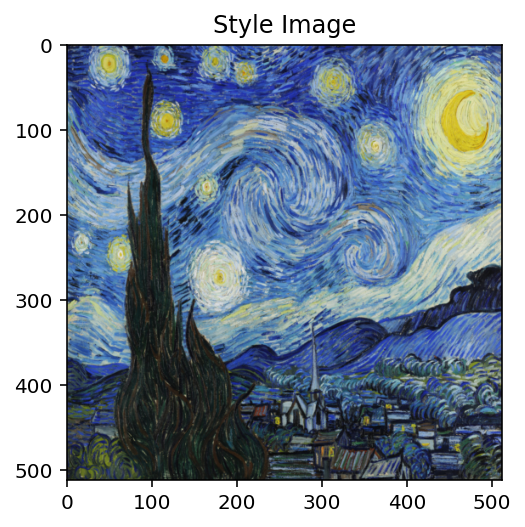

In [10]:
style_path ="/content/drive/MyDrive/ML_Project/Style/"
style = ["Edvard Munch - The Scream",
         "Katsushika Hokusai - The Great Wave off Kanagawa",
         "Vincent Van Gogh - The Starry Night",
         "Claude Monet - Water-Lilies (1916)",
         "Leonardo Da Vinci - Portrait of Lisa Gherardini",
         "Mosaic"]
style_path = style_path + style[2] + '.jpg'
style_img = image_loader(style_path).to(device)
imshow(style_img, title='Style Image')

Import pretrained VGG19 network.

In [11]:
vgg19 = models.vgg19(pretrained=True)
vgg19 = VGG(vgg19.features[:36]).to(device).eval()

## Gram 矩阵函数

In [12]:
def gram_matrix(y):
    (b, ch, h, w) = y.size()
    features = y.view(b, ch, w * h)
    features_t = features.transpose(1, 2)
    gram = features.bmm(features_t) / (ch * h * w)
    return gram

# 训练模型

## 载入 COCO 数据集

In [13]:
#!unzip -u "/content/drive/MyDrive/train2014.zip" -d "/content/drive/MyDrive/ML_Project"

In [14]:
!rm -rf /home/kristallqiu/Downloads/train2014/*/.AppleDouble

batch_size = 1
width = 256

data_transform = transforms.Compose([
    transforms.Resize(width), 
    transforms.CenterCrop(width), 
    transforms.ToTensor(), 
    tensor_normalizer, 
])

dataset = torchvision.datasets.ImageFolder("/content/drive/MyDrive/ML_Project/LabelMe", transform=data_transform)
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)
dataset

Dataset ImageFolder
    Number of datapoints: 19904
    Root location: /content/drive/MyDrive/ML_Project/LabelMe
    StandardTransform
Transform: Compose(
               Resize(size=256, interpolation=bilinear)
               CenterCrop(size=(256, 256))
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

## 计算风格图像的 Gram 矩阵

In [15]:
style_features = vgg19(style_img)
style_grams = [gram_matrix(x) for x in style_features]
style_grams = [x.detach() for x in style_grams]
[x.shape for x in style_grams]

[torch.Size([1, 64, 64]),
 torch.Size([1, 128, 128]),
 torch.Size([1, 256, 256]),
 torch.Size([1, 512, 512]),
 torch.Size([1, 512, 512]),
 torch.Size([1, 512, 512])]

## 开始训练

https://github.com/jcjohnson/fast-neural-style/blob/master/doc/training.md

In [16]:
transform_net = TransformNet(base=32, tanh=False).to(device) # add Tanh as activation function

In [17]:
%mkdir -p debug

def tensor_to_array(tensor):
    x = tensor.cpu().detach().numpy()
    x = (x*255).clip(0, 255).transpose(0, 2, 3, 1).astype(np.uint8)
    return x

def save_debug_image(style_images, content_images, transformed_images, filename):
    style_image = Image.fromarray(image_unloader(style_images))
    content_images = [image_unloader(x) for x in content_images]
    transformed_images = [image_unloader(x) for x in transformed_images]
    
    new_im = Image.new('RGB', (style_image.size[0] + (width + 5) * 4, max(style_image.size[1], width*2 + 5)))
    new_im.paste(style_image, (0,0))
    
    x = style_image.size[0] + 5
    for i, (a, b) in enumerate(zip(content_images, transformed_images)):
        new_im.paste(Image.fromarray(a), (x + (width + 5) * i, 0))
        new_im.paste(Image.fromarray(b), (x + (width + 5) * i, width + 5))
    
    new_im.save(filename)

In [18]:
verbose_batch = 800
style_weight = 1e5
content_weight = 1
tv_weight = 1e-6

optimizer = optim.Adam(transform_net.parameters(), 1e-3)
transform_net.train()

n_batch = len(data_loader)

content_loss_lst = []
style_loss_lst = []
tv_loss_lst = []
total_loss_lst = []

for epoch in range(1):
    print('Epoch: {}'.format(epoch+1))
    smooth_content_loss = Smooth()
    smooth_style_loss = Smooth()
    smooth_tv_loss = Smooth()
    smooth_loss = Smooth()
    with tqdm(enumerate(data_loader), total=n_batch) as pbar:
        for batch, (content_images, _) in pbar:
            optimizer.zero_grad()

            # 使用风格模型预测风格迁移图像
            content_images = content_images.to(device)
            transformed_images = transform_net(content_images)
            transformed_images = transformed_images.clamp(-3, 3)

            # 使用 vgg19 计算特征
            content_features = vgg19(content_images)
            transformed_features = vgg19(transformed_images)

            # content loss
            content_loss = content_weight * F.mse_loss(transformed_features[1], content_features[1])
            content_loss_lst.append(content_loss)
            # total variation loss
            y = transformed_images
            tv_loss = tv_weight * (torch.sum(torch.abs(y[:, :, :, :-1] - y[:, :, :, 1:])) + 
            torch.sum(torch.abs(y[:, :, :-1, :] - y[:, :, 1:, :])))
            tv_loss_lst.append(tv_loss)
            # style loss
            style_loss = 0.
            transformed_grams = [gram_matrix(x) for x in transformed_features]
            for transformed_gram, style_gram in zip(transformed_grams, style_grams):
                style_loss += style_weight * F.mse_loss(transformed_gram, 
                                                        style_gram.expand_as(transformed_gram))
            style_loss_lst.append(style_loss)
            # 加起来
            loss = style_loss + content_loss + tv_loss
            total_loss_lst.append(loss)
            loss.backward()
            optimizer.step()

            smooth_content_loss += content_loss.item()
            smooth_style_loss += style_loss.item()
            smooth_tv_loss += tv_loss.item()
            smooth_loss += loss.item()
            
            s = f'Content: {smooth_content_loss:.2f} '
            s += f'Style: {smooth_style_loss:.2f} '
            s += f'TV: {smooth_tv_loss:.4f} '
            s += f'Loss: {smooth_loss:.2f}'
            if batch % verbose_batch == 0:
                s = '\n' + s
                save_debug_image(style_img, content_images, transformed_images, 
                                 f"debug/s2_{epoch}_{batch}.jpg")
            
            pbar.set_description(s)
    torch.save(transform_net.state_dict(), 'transform_net.pth')

  0%|          | 0/19904 [00:00<?, ?it/s]

Epoch: 1



Content: 5.28 Style: 33.24 TV: 0.1375 Loss: 38.65:   0%|          | 0/19904 [00:00<?, ?it/s]
Content: 6.45 Style: 3.23 TV: 0.1281 Loss: 9.81:   4%|▍         | 799/19904 [03:50<1:33:14,  3.42it/s]
Content: 6.46 Style: 3.23 TV: 0.1281 Loss: 9.82:   4%|▍         | 799/19904 [03:50<1:33:14,  3.42it/s]
Content: 5.82 Style: 2.14 TV: 0.1179 Loss: 8.08:   8%|▊         | 1600/19904 [07:52<1:37:09,  3.14it/s]
Content: 5.84 Style: 2.14 TV: 0.1180 Loss: 8.10:   8%|▊         | 1600/19904 [07:53<1:37:09,  3.14it/s]
Content: 3.55 Style: 1.36 TV: 0.0841 Loss: 4.99: 100%|██████████| 19904/19904 [1:39:20<00:00,  3.34it/s]


In [19]:
torch.save(transform_net.state_dict(), '/content/drive/MyDrive/ML_Project/transform_net_StarryNight.pth')

# 可视化风格图片

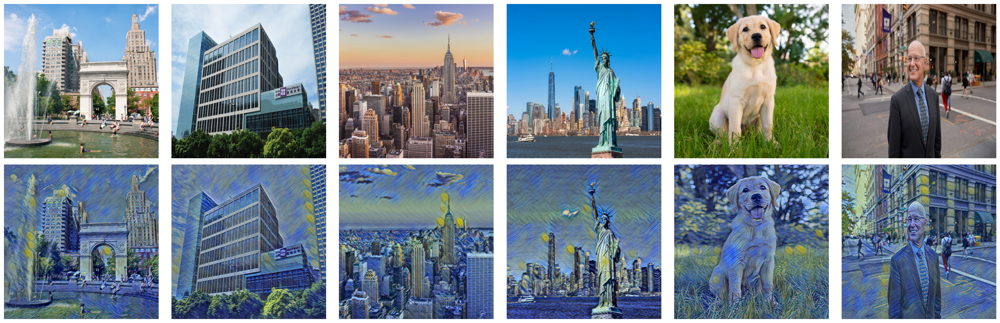

In [20]:
runtime = []
content = ['washington-square-park',
           'nyush',
           'ny', 'ny1',
           'dog','andrew hamilton']
content_img_unloaded = []
output_img_unloaded = []
for i in range(len(content)):
    start_time = time.time()
    content_img = image_loader("/content/drive/MyDrive/ML_Project/Test/"+content[i]+'.jpeg').to(device)
    output_img = transform_net(content_img)
    end_time = time.time()
    '''
    plt.figure(figsize=(8, 3))

    plt.subplot(1, 3, 1)
    plt.imshow(image_unloader(style_img))
    plt.title('Style Image')
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(image_unloader(content_img))
    plt.title('Content Image')
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(image_unloader(output_img.detach()))
    plt.title('Output Image')
    plt.axis('off')
    plt.tight_layout()
    #plt.savefig(f'/content/drive/MyDrive/ML_Project/Result/S2_'+str(i+1)+'.png')
    plt.show()
    print('Transfer runtime:',end_time-start_time)'''
    content_img_unloaded.append(image_unloader(content_img))
    output_img_unloaded.append(image_unloader(output_img))
    runtime.append(end_time-start_time)
plt.figure(figsize=(25,8))
total = content_img_unloaded + output_img_unloaded
for i in range(1, len(total)+1):
    plt.subplot(2,len(style),i)
    plt.imshow(total[i-1])
    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.tight_layout()
plt.savefig(f'/content/drive/MyDrive/ML_Project/Result/S2-StarryNight.png')
plt.show()

In [21]:
np.array(runtime).mean()

0.5900574525197347

Text(0, 0.5, 'Loss')

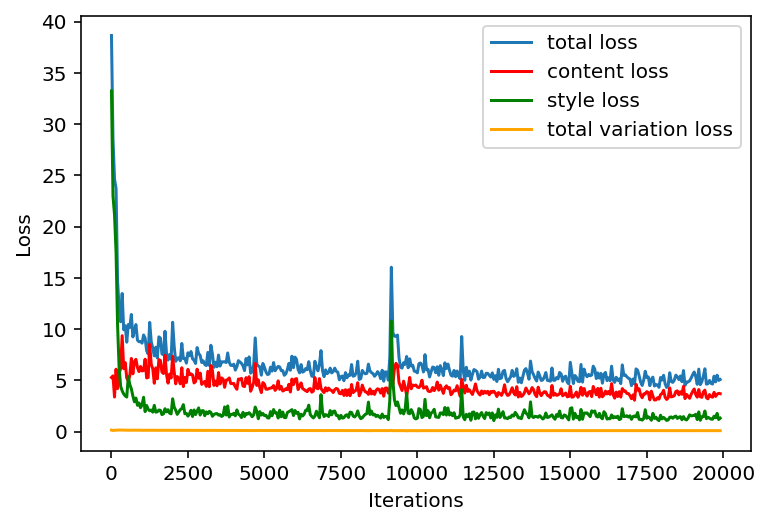

In [22]:
plt.plot(range(0, len(content_loss_lst),50),[total_loss_lst[i].cpu().detach().numpy() for i in range(0, len(content_loss_lst),50)],label='total loss')
plt.plot(range(0, len(content_loss_lst),50),[content_loss_lst[i].cpu().detach().numpy() for i in range(0, len(content_loss_lst),50)], color='r',label='content loss')
plt.plot(range(0, len(content_loss_lst),50),[style_loss_lst[i].cpu().detach().numpy() for i in range(0, len(content_loss_lst),50)], color='g',label='style loss')
plt.plot(range(0, len(content_loss_lst),50),[tv_loss_lst[i].cpu().detach().numpy() for i in range(0, len(content_loss_lst),50)], color='orange',label='total variation loss')
plt.legend()
plt.xlabel('Iterations')
plt.ylabel('Loss')
#plt.savefig(f'/content/drive/MyDrive/ML_Project/Result/S2-TheScream-loss.png')